In [ ]:
# Install required packages
!pip install pyyaml
!pip install fvcore
!pip install omegaconf

In [9]:
# Connect google drive
from google.colab import drive
drive.mount("/content/gdrive")

# Set directory
%cd /content/gdrive/MyDrive/detectron2

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/MyDrive/detectron2


In [10]:
# Import pacakges
import os
import cv2
import torch
import numpy as np
from google.colab.patches import cv2_imshow

from detectron2.utils.logger import setup_logger
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg

# Setup logger
setup_logger()

<Logger detectron2 (DEBUG)>

In [11]:
# Create and set model's config
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")

# Create model
predictor = DefaultPredictor(cfg)

[03/31 20:24:47 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x/138205316/model_final_a3ec72.pkl ...


model_final_a3ec72.pkl: 254MB [00:01, 209MB/s]                           


In [12]:
# Load image (np.array type)
img = cv2.imread("samples/sample_001.JPG")

# Inferrence
outputs = predictor(img)

# Tensor: gpu -> cpu
outputs['instances'] = outputs['instances'].to("cpu")

/usr/local/lib/python3.9/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [16]:
masks = outputs['instances'].pred_masks
obj_mask = np.sum(np.asarray(masks.unsqueeze(-1)),0)
bg_mask = 1-obj_mask

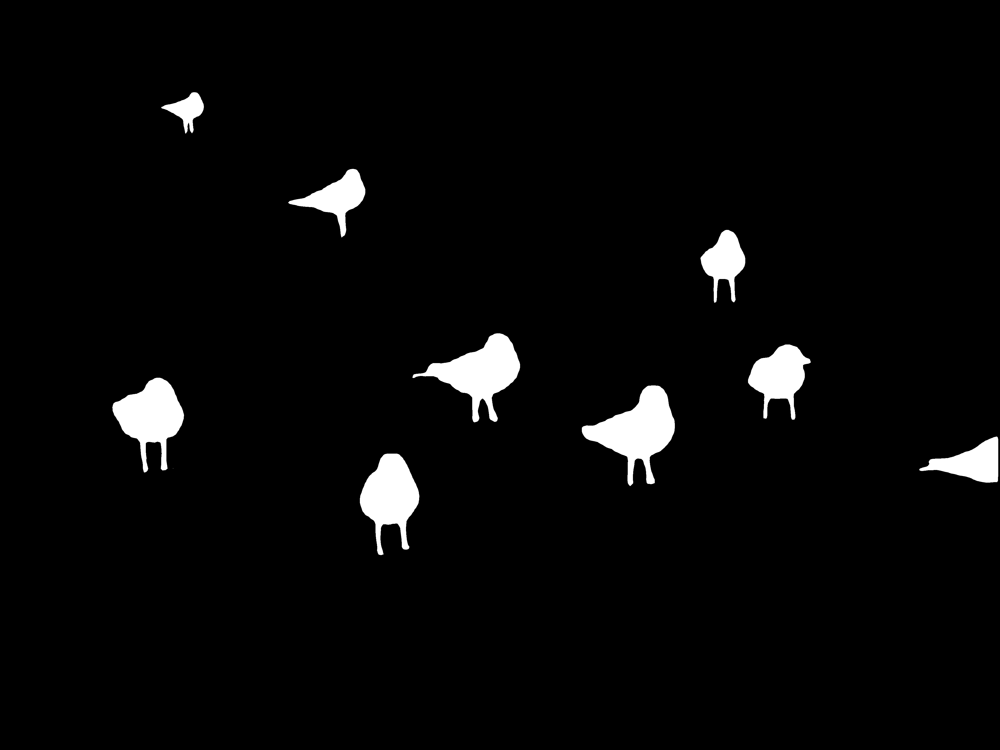

In [19]:
# obj_mask (black:0, white:1)
cv2_imshow(255*obj_mask)

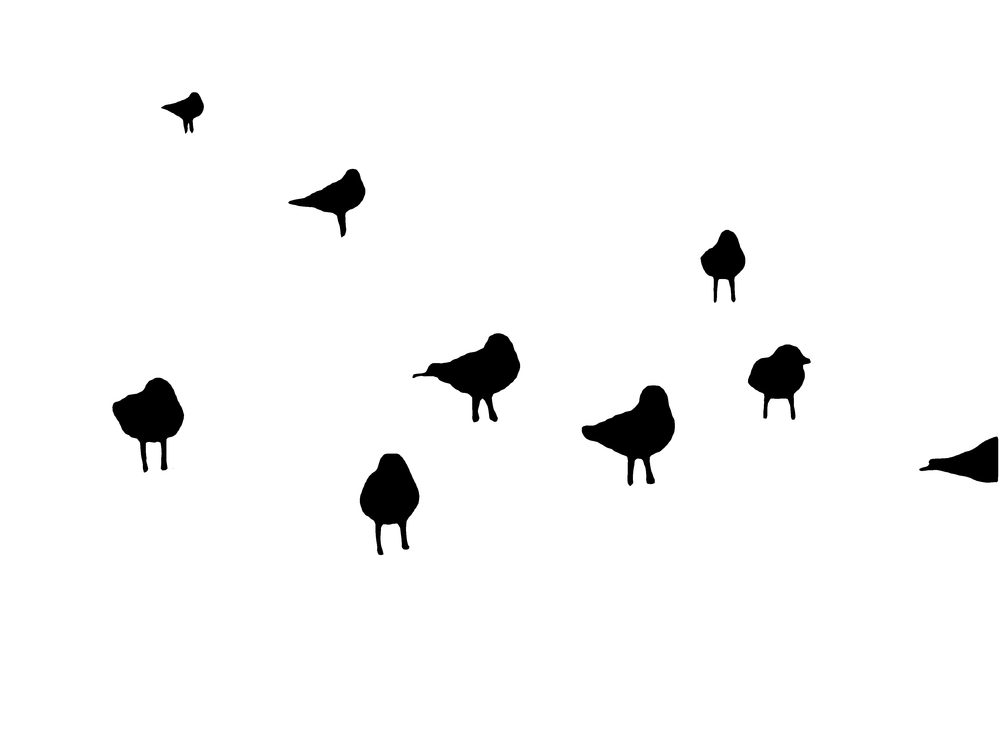

In [20]:
# bg_mask (black:0, white:1)
cv2_imshow(255*bg_mask)

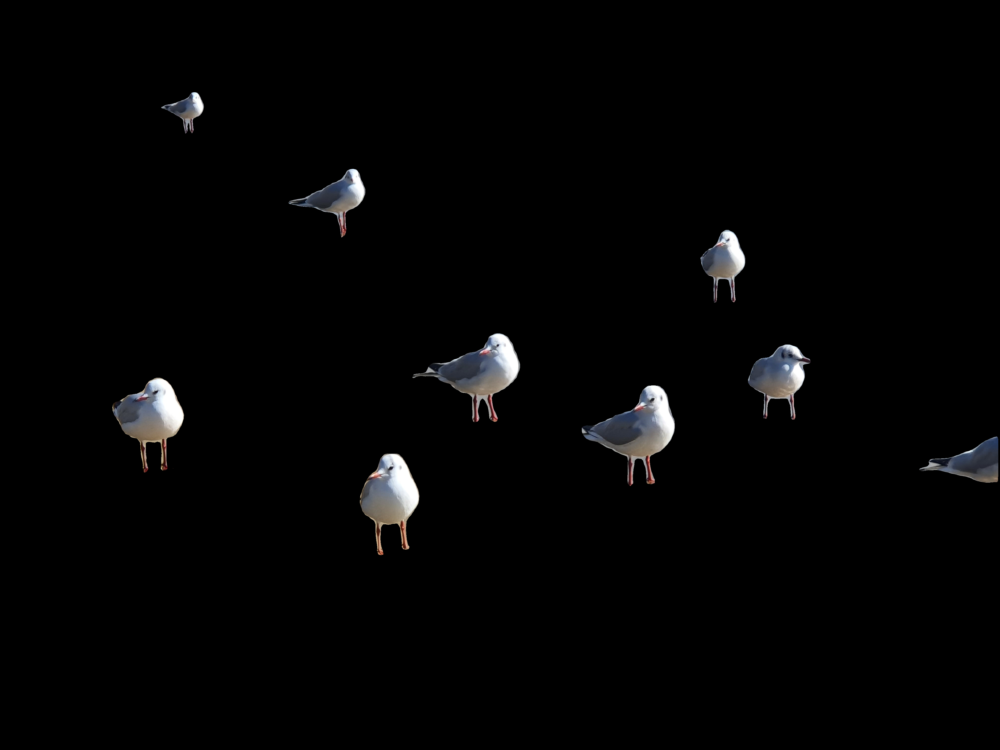

In [18]:
# Only object
cv2_imshow(obj_mask*img)

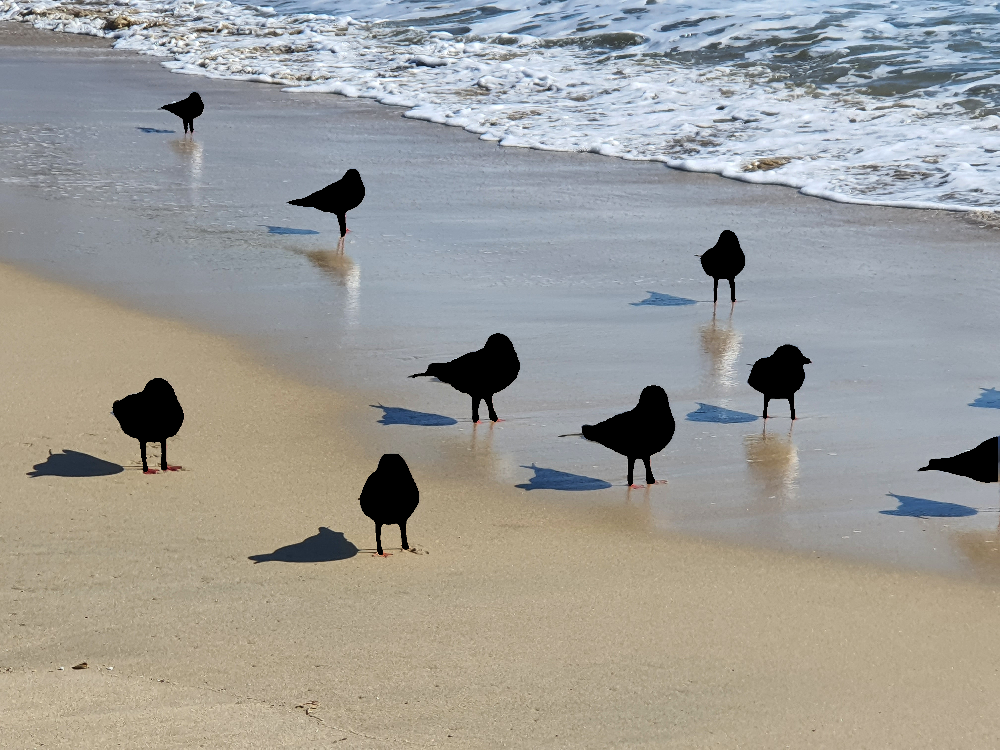

In [17]:
# Only Background
cv2_imshow(bg_mask*img)